<a href="https://colab.research.google.com/github/QuocHuy-1602/BrainTumor/blob/main/brain_tumor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

In [ ]:
# Importing dependencies

import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


SEED = 99
THRESHOLD = 0.6

detectron2 version: 0.6


# Creating Datasets

In [ ]:
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode


for d in ["train", "valid","test"]:
    register_coco_instances(f"brain_tumor_{d}", {},
                            f"../input/brain-tumor-image-dataset-semantic-segmentation/{d}/_annotations.coco.json",
                            f"../input/brain-tumor-image-dataset-semantic-segmentation/{d}")

In [ ]:
from detectron2.utils.visualizer import Visualizer

my_dataset_train_metadata = MetadataCatalog.get("brain_tumor_train")
train_dataset_dicts = DatasetCatalog.get("brain_tumor_train")

# A function that creates examples from the dataset
def create_random_images(dataset_dict,dataset_metadata, seed, image_scale = 0.7):
    np.random.seed(seed)
    images = np.random.permutation(dataset_dict)[:2]

    fig, axs = plt.subplots(1,2, figsize = (12,6), dpi = 100)
    for i in range(2):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        vis = visualizer.draw_dataset_dict(im)
        final_img = vis.get_image()

        axs[i].set_title('image id: ' + str(img_id), fontsize = 10)
        axs[i].axis('off')
        axs[i].imshow(final_img)

WARNING [01/20 19:55:06 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 19:55:06 d2.data.datasets.coco]: Loaded 1502 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/train/_annotations.coco.json


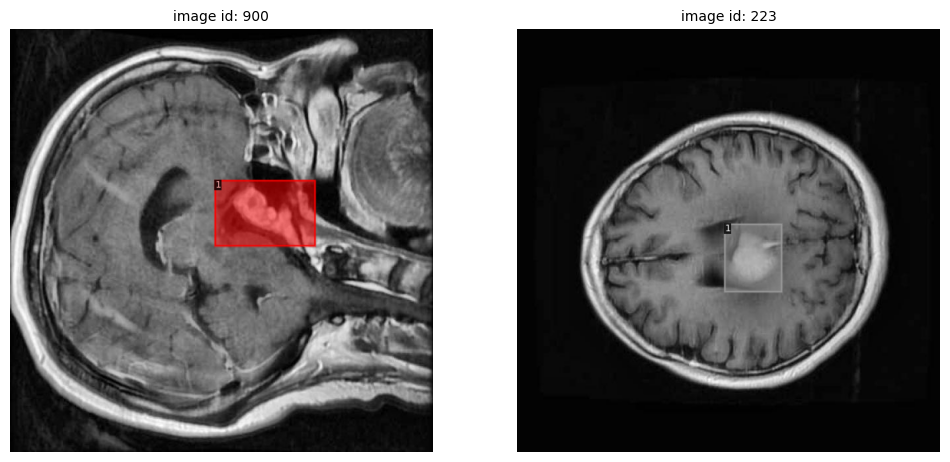

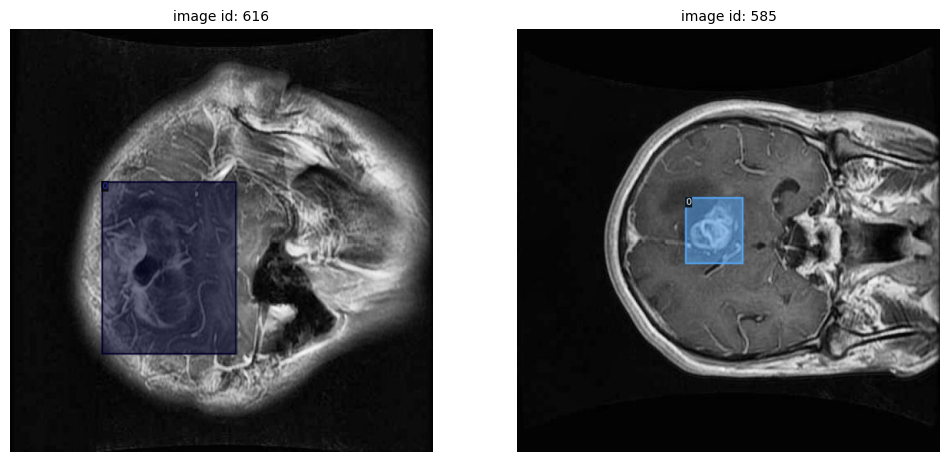

In [ ]:
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 95, image_scale = 1)
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 99, image_scale = 1)

# <span style="color:#e74c3c;"> Training </span>

In [ ]:
from detectron2.engine import DefaultTrainer

EPOCHS = 3300
NUM_CLASSES = 3
BASE_LR = 0.0001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("brain_tumor_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = EPOCHS
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# uncomment below to train
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/20 19:55:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:01, 230MB/s]                           


[01/20 19:55:12 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/20 19:55:31 d2.utils.events]:  eta: 0:38:36  iter: 19  total_loss: 2.28  loss_cls: 1.419  loss_box_reg: 0.07108  loss_mask: 0.6954  loss_rpn_cls: 0.09266  loss_rpn_loc: 0.007266    time: 0.7063  last_time: 0.5886  data_time: 0.0102  last_data_time: 0.0053   lr: 1.9981e-06  max_mem: 3920M


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[01/20 19:55:57 d2.utils.events]:  eta: 0:38:05  iter: 39  total_loss: 2.189  loss_cls: 1.334  loss_box_reg: 0.08625  loss_mask: 0.6932  loss_rpn_cls: 0.06415  loss_rpn_loc: 0.006315    time: 0.7224  last_time: 0.6931  data_time: 0.0053  last_data_time: 0.0054   lr: 3.9961e-06  max_mem: 3921M
[01/20 19:56:12 d2.utils.events]:  eta: 0:38:07  iter: 59  total_loss: 1.994  loss_cls: 1.145  loss_box_reg: 0.06966  loss_mask: 0.6904  loss_rpn_cls: 0.05902  loss_rpn_loc: 0.005555    time: 0.7305  last_time: 0.8370  data_time: 0.0054  last_data_time: 0.0052   lr: 5.9941e-06  max_mem: 3923M
[01/20 19:56:26 d2.utils.events]:  eta: 0:37:53  iter: 79  total_loss: 1.761  loss_cls: 0.9289  loss_box_reg: 0.08392  loss_mask: 0.6842  loss_rpn_cls: 0.05448  loss_rpn_loc: 0.005662    time: 0.7319  last_time: 0.7922  data_time: 0.0058  last_data_time: 0.0062   lr: 7.9921e-06  max_mem: 3941M
[01/20 19:56:41 d2.utils.events]:  eta: 0:37:49  iter: 99  total_loss: 1.507  loss_cls: 0.6585  loss_box_reg: 0.06486

In [ ]:
# Saving the model

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[01/20 20:36:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# Training Results

In [ ]:
def reading_metrics_from_json(metrics_path):
    metrics = []
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        try:
            metric.append(metrics[i][specific_metric])
        except KeyError:
            pass
    return metric

In [ ]:
train_metrics = reading_metrics_from_json('/kaggle/working/output/metrics.json')

iters = metric(train_metrics, 'iteration')
total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
loss_mask = metric(train_metrics, 'loss_mask')
loss_box_reg = metric(train_metrics, 'loss_box_reg')


# checking metric lengths
if len(iters) == len(total_loss) == len(cls_acc) == len(loss_mask) == len(loss_box_reg):
    pass
else:
    iters = iters[:-1]

Text(0.5, 1.0, 'Mask Loss')

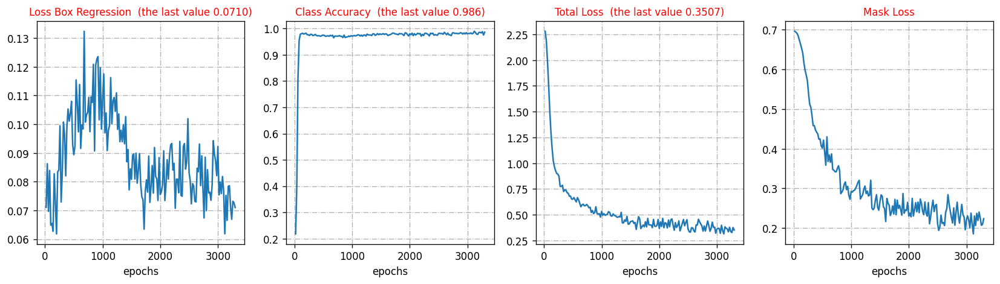

In [ ]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)


axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, loss_mask)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('Mask Loss', fontsize = 10, color = 'red')

# Validation Predictions

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("brain_tumor_valid", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "brain_tumor_valid")
inference_on_dataset(trainer.model, test_loader, evaluator)

[01/20 20:36:48 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/20 20:36:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 20:36:48 d2.data.datasets.coco]: Loaded 429 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/valid/_annotations.coco.json
[01/20 20:36:49 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 210          | 1          | 219          |
|            |              |            |              |            |              |
|   total    | 429          |            |              |            |              |
[01/20 20:36:49 d2.data.dataset_mapper]: [DatasetMapper] Augmentations us

OrderedDict([('bbox',
              {'AP': 41.5089703495689,
               'AP50': 78.78542778070378,
               'AP75': 39.33633296338073,
               'APs': nan,
               'APm': 35.90253620941724,
               'APl': 45.14830971012777,
               'AP-Tumor': nan,
               'AP-0': 30.564170465615426,
               'AP-1': 52.45377023352238}),
             ('segm',
              {'AP': 40.35931216703303,
               'AP50': 78.41819630146829,
               'AP75': 39.834750644238184,
               'APs': nan,
               'APm': 34.23180136735912,
               'APl': 43.879073807585705,
               'AP-Tumor': nan,
               'AP-0': 30.356857867665667,
               'AP-1': 50.36176646640038})])

In [ ]:
my_dataset_test_metadata = MetadataCatalog.get("brain_tumor_valid")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("brain_tumor_valid")


def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]

    fig, axs = plt.subplots(3,2, figsize = (20,20), dpi = 120)

    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()

        visualizer2 = Visualizer(img[:, :, ::-1], metadata= dataset_metadata, scale=image_scale, instance_mode=ColorMode.IMAGE_BW)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)

        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 20)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)

        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 20, color = 'red')
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox[:, :, ::-1])

    fig.tight_layout()

WARNING [01/20 20:37:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 20:37:45 d2.data.datasets.coco]: Loaded 429 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/valid/_annotations.coco.json


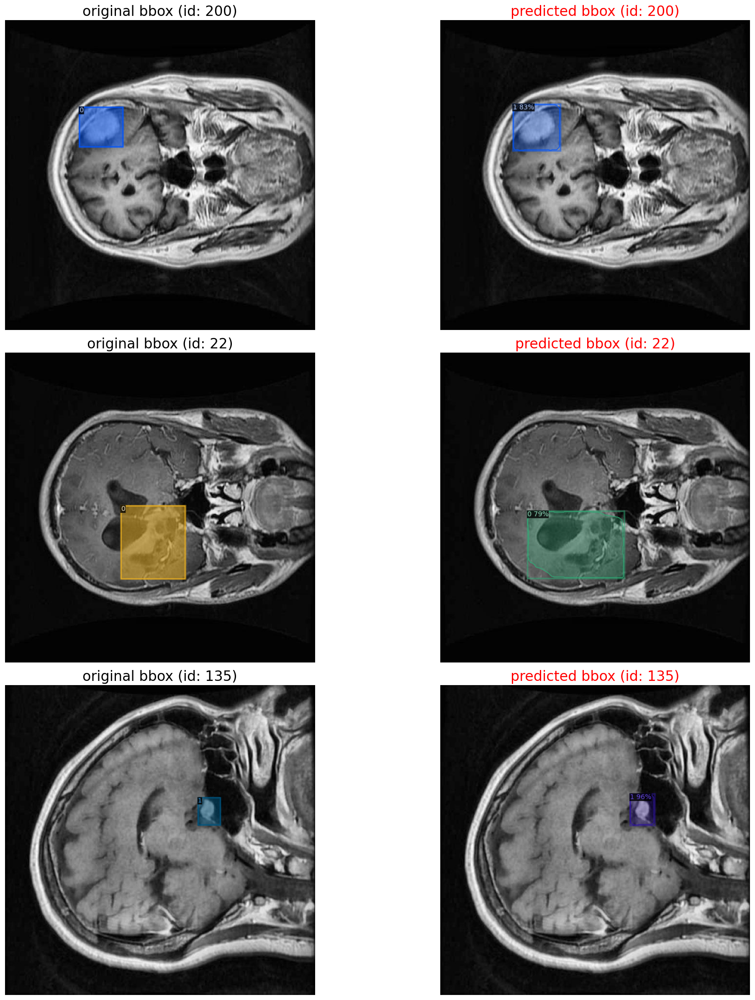

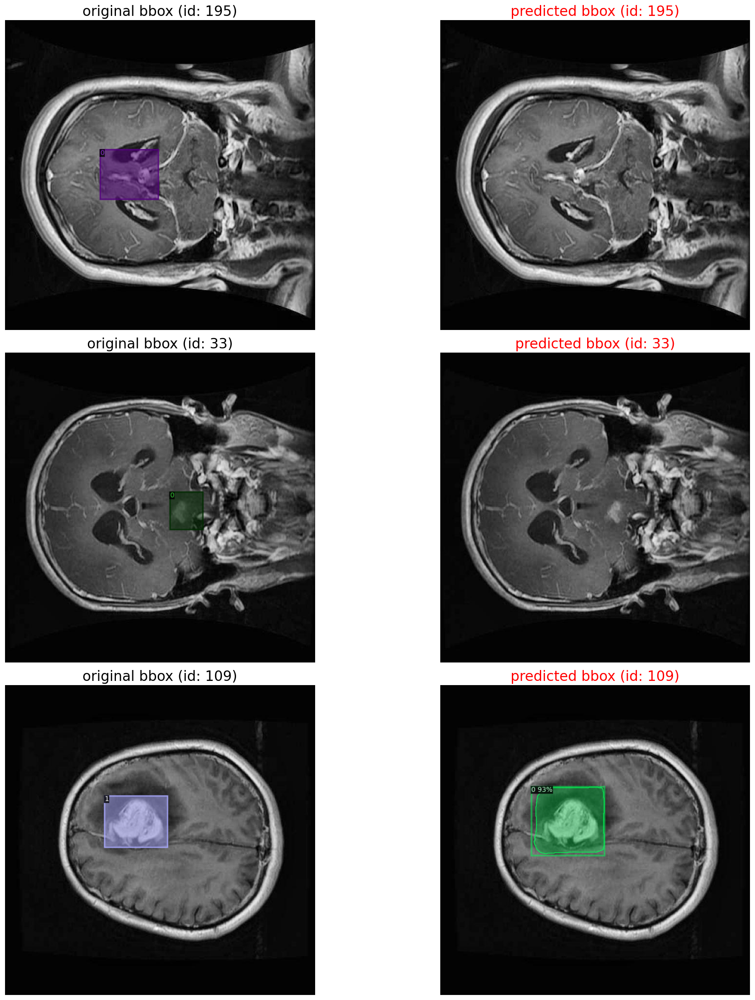

In [ ]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 421, image_scale = 1)
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 83, image_scale = 1)

# Test Predictions

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("brain_tumor_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "brain_tumor_test")
inference_on_dataset(trainer.model, test_loader, evaluator)


my_dataset_test_metadata = MetadataCatalog.get("brain_tumor_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("brain_tumor_test")

[01/20 20:37:52 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/20 20:37:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 20:37:52 d2.data.datasets.coco]: Loaded 215 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/test/_annotations.coco.json
[01/20 20:37:52 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 118          | 1          | 97           |
|            |              |            |              |            |              |
|   total    | 215          |            |              |            |              |
[01/20 20:37:52 d2.data.dataset_mapper]: [DatasetMapper] Augmentations use

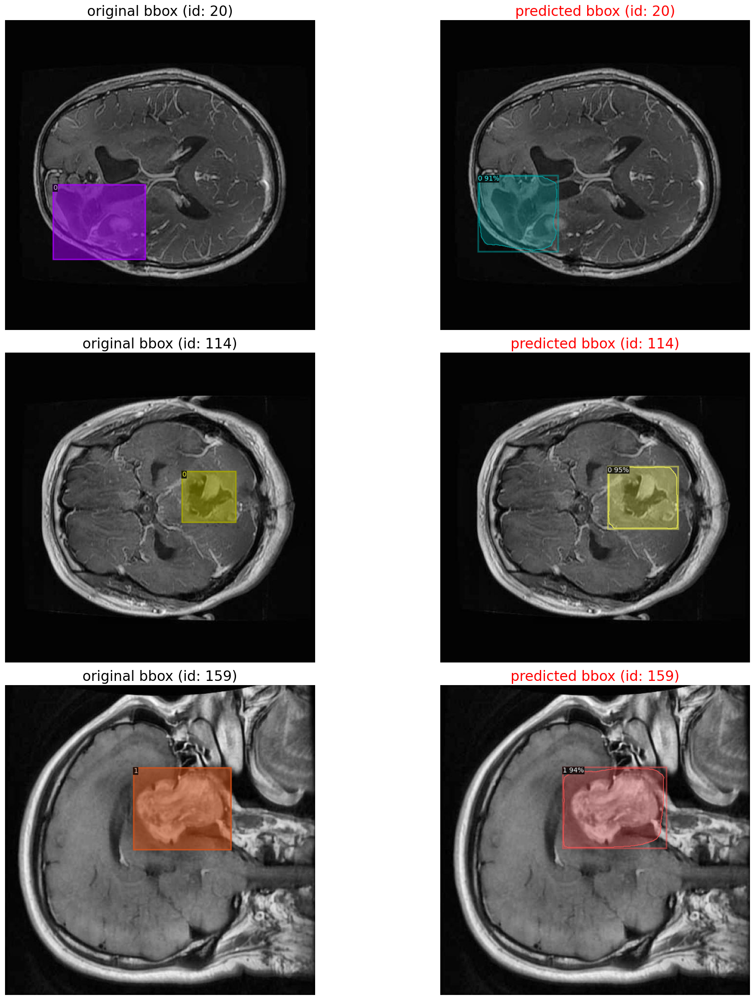

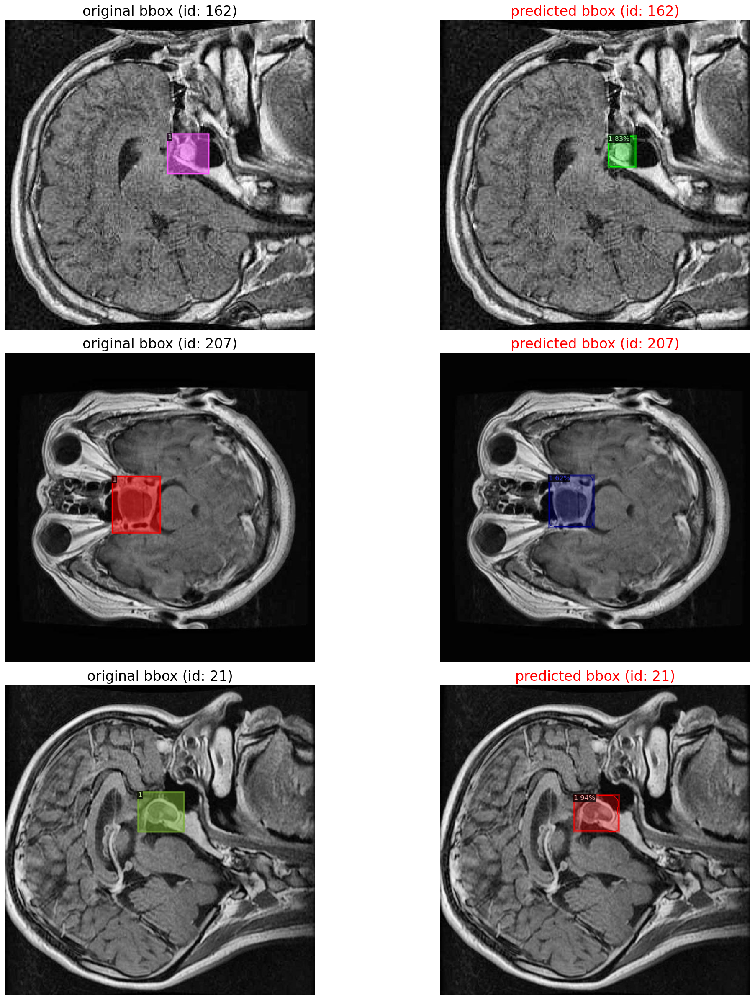

In [ ]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 154, image_scale = 1)
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 51, image_scale = 1)